In [27]:
import csv
import datetime
import matplotlib.pyplot as plt
from collections import defaultdict
from math import radians, sin, cos, sqrt, atan2

In [28]:
# File Path
filename = "trip_data_6.csv"

# Initialize variables
num_rows = 0
min_date, max_date = None, None
field_names = []
sample_data = []
trip_distances = []
hourly_passenger_count = defaultdict(list)
distinct_values = defaultdict(set)

# NYC latitude ranges from ~40.5 to 41
# NYC longitude ranges from ~-74.3 to -73.7
numeric_fields = {
    'pickup_longitude': {'min': -74.3, 'max': -73.7},
    'pickup_latitude': {'min': 40.5, 'max': 41.0},
    'dropoff_longitude': {'min': -74.3, 'max': -73.7},
    'dropoff_latitude': {'min': 40.5, 'max': 41.0},
}
numeric_fields1 = {
    'rate_code': {'min': float('inf'), 'max': float('-inf')},
    'passenger_count': {'min': float('inf'), 'max': float('-inf')},
    'trip_time_in_secs': {'min': float('inf'), 'max': float('-inf')},
    'trip_distance': {'min': float('inf'), 'max': float('-inf')}
}


# Define valid coordinate range
VALID_LAT_RANGE = (40.5, 41.0)
VALID_LON_RANGE = (-74.3, -73.7)

# Define categorical fields (to track distinct values efficiently)
categorical_fields = {'rate_code', 'store_and_fwd_flag'}

# Function to compute Haversine distance
def haversine(coord1, coord2):
    R = 6371.0  # Earth radius in km
    lat1, lon1 = map(radians, coord1)
    lat2, lon2 = map(radians, coord2)
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c


Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping invalid coordinates: (0.0, 0.0) -> (0.0, 0.0)
Skipping i

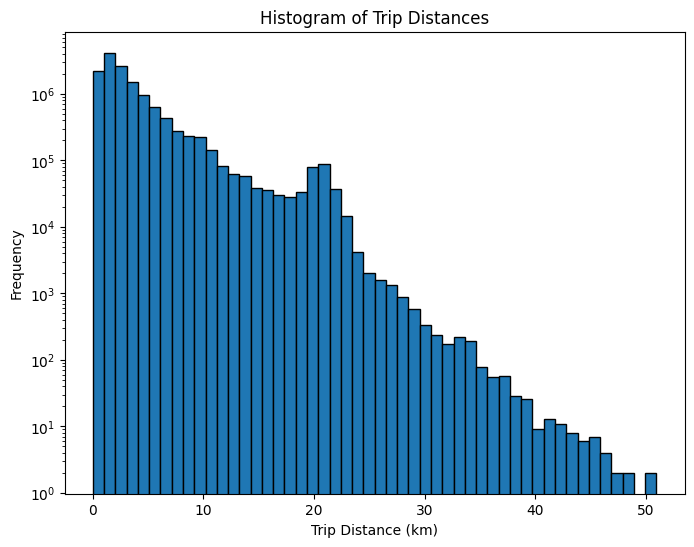

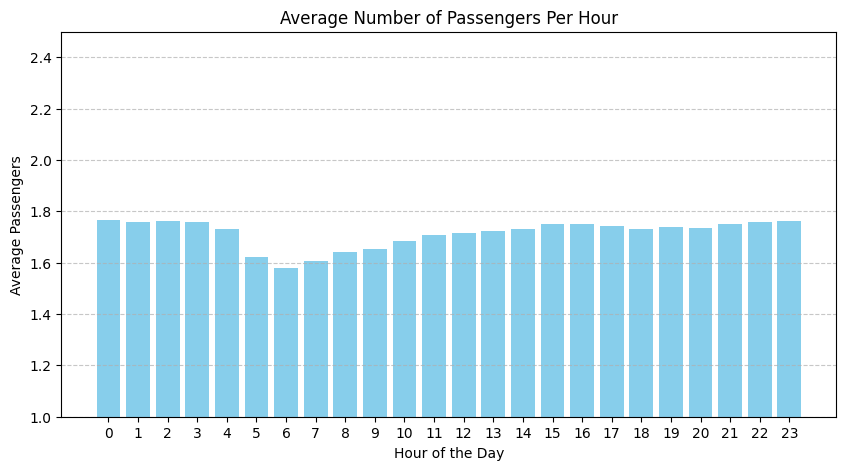

In [29]:
# Read the CSV file
with open(filename, 'r') as f:
    reader = csv.reader(f)
    field_names = [field.strip() for field in next(reader)]  # Remove spaces from column names

    for i, row in enumerate(reader):
        num_rows += 1
        
        # Capture sample data
        if i < 5:
            sample_data.append(row)
        
        # Parse dates
        try:
            pickup_datetime = datetime.datetime.strptime(row[5], "%Y-%m-%d %H:%M:%S")
            dropoff_datetime = datetime.datetime.strptime(row[6], "%Y-%m-%d %H:%M:%S")
        except (ValueError, IndexError):
            continue
        
        if min_date is None or pickup_datetime < min_date:
            min_date = pickup_datetime
        if max_date is None or dropoff_datetime > max_date:
            max_date = dropoff_datetime
        
        # Parse geographic coordinates
        try:
            pickup_lon, pickup_lat = float(row[10]), float(row[11])
            dropoff_lon, dropoff_lat = float(row[12]), float(row[13])
            
            # Validate coordinates
            if (VALID_LAT_RANGE[0] <= pickup_lat <= VALID_LAT_RANGE[1] and 
                VALID_LON_RANGE[0] <= pickup_lon <= VALID_LON_RANGE[1] and 
                VALID_LAT_RANGE[0] <= dropoff_lat <= VALID_LAT_RANGE[1] and 
                VALID_LON_RANGE[0] <= dropoff_lon <= VALID_LON_RANGE[1]):
                
                # Calculate Haversine distance
                distance = haversine((pickup_lat, pickup_lon), (dropoff_lat, dropoff_lon))
                if distance < 1000:  # Filtering out extreme outliers
                    trip_distances.append(distance)
                
                # Update geographic range
                numeric_fields['pickup_longitude']['min'] = min(numeric_fields['pickup_longitude']['min'], pickup_lon)
                numeric_fields['pickup_longitude']['max'] = max(numeric_fields['pickup_longitude']['max'], pickup_lon)
                numeric_fields['pickup_latitude']['min'] = min(numeric_fields['pickup_latitude']['min'], pickup_lat)
                numeric_fields['pickup_latitude']['max'] = max(numeric_fields['pickup_latitude']['max'], pickup_lat)
                numeric_fields['dropoff_longitude']['min'] = min(numeric_fields['dropoff_longitude']['min'], dropoff_lon)
                numeric_fields['dropoff_longitude']['max'] = max(numeric_fields['dropoff_longitude']['max'], dropoff_lon)
                numeric_fields['dropoff_latitude']['min'] = min(numeric_fields['dropoff_latitude']['min'], dropoff_lat)
                numeric_fields['dropoff_latitude']['max'] = max(numeric_fields['dropoff_latitude']['max'], dropoff_lat)
            else:
                print(f"Skipping invalid coordinates: ({pickup_lat}, {pickup_lon}) -> ({dropoff_lat}, {dropoff_lon})")

        except (ValueError, IndexError):
            continue
        
        # Track distinct categorical values
        for index, value in enumerate(row):
            field = field_names[index]
            if field in categorical_fields:
                distinct_values[field].add(value)
                
        # Collect hourly passenger count
        try:
            hour = pickup_datetime.hour
            passenger_count = int(row[7])
            hourly_passenger_count[hour].append(passenger_count)
        except (ValueError, IndexError):
            continue
        
        # Update numeric fields (only for valid numeric fields)
        for index, value in enumerate(row):
            try:
                num_value = float(value)
                if field_names[index] in numeric_fields1:
                    field = field_names[index]
                    numeric_fields1[field]['min'] = min(numeric_fields1[field]['min'], num_value)
                    numeric_fields1[field]['max'] = max(numeric_fields1[field]['max'], num_value)
            except ValueError:
                pass

# Compute final statistics
average_trip_distance = sum(trip_distances) / len(trip_distances) if trip_distances else 0

# Plot histogram of trip distances
plt.figure(figsize=(8, 6))
plt.hist(trip_distances, bins=50, edgecolor='black', log=True)
plt.xlabel('Trip Distance (km)')
plt.ylabel('Frequency')
plt.title('Histogram of Trip Distances')
plt.show()

# Compute hourly passenger average
hourly_avg_passengers = {hour: sum(counts) / len(counts) for hour, counts in hourly_passenger_count.items() if counts}

# Plot hourly passenger count
plt.figure(figsize=(10, 5))
plt.bar(hourly_avg_passengers.keys(), hourly_avg_passengers.values(), color='skyblue')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Passengers')
plt.title('Average Number of Passengers Per Hour')
plt.xticks(range(24))
plt.ylim(1, 2.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [34]:
# Print results
print(f"DateTime Range: {min_date} to {max_date}")
print(f"Total Rows: {num_rows}")
print(f"Field Names: {field_names}")
print(f"Sample Data: {sample_data}")
print(f"Geographic Range:")
print(f"  Pickup Longitude: {numeric_fields['pickup_longitude']['min']} to {numeric_fields['pickup_longitude']['max']}")
print(f"  Pickup Latitude: {numeric_fields['pickup_latitude']['min']} to {numeric_fields['pickup_latitude']['max']}")
print(f"  Dropoff Longitude: {numeric_fields['dropoff_longitude']['min']} to {numeric_fields['dropoff_longitude']['max']}")
print(f"  Dropoff Latitude: {numeric_fields['dropoff_latitude']['min']} to {numeric_fields['dropoff_latitude']['max']}")
print(f"Average Trip Distance: {average_trip_distance:.2f} km")
print(f"Distinct Values per Field:")
for field, values in distinct_values.items():
    print(f"{field}: {len(values)} distinct values")
print(f"Numeric Field Min/Max Values:")
for field, stats in numeric_fields1.items():
    print(f"{field}: Min={stats['min']}, Max={stats['max']}")

DateTime Range: 2013-06-01 00:00:00 to 2013-07-01 01:14:24
Total Rows: 14385456
Field Names: ['medallion', 'hack_license', 'vendor_id', 'rate_code', 'store_and_fwd_flag', 'pickup_datetime', 'dropoff_datetime', 'passenger_count', 'trip_time_in_secs', 'trip_distance', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']
Sample Data: [['D1C79CF706C80D3A1DC7FBCA6CD56E43', 'DAC7742E8F00034774098DBC6B4FF2B7', 'CMT', '1', 'N', '2013-06-03 00:02:12', '2013-06-03 00:10:07', '1', '474', '1.30', '-73.981583', '40.773529', '-73.981827', '40.782124'], ['3567E8B49FEBFCBB587F1864D723D5C8', '430B8022563CDE1D51D44786DFD8D6CB', 'CMT', '1', 'N', '2013-06-03 00:03:03', '2013-06-03 00:19:27', '1', '982', '4.90', '-73.999565', '40.728367', '-73.952927', '40.729546'], ['4220E1995D36A40DF34664AD33ED13F6', '48A1C9C9300AFC7BDBB718CE308EE45A', 'CMT', '2', 'N', '2013-06-03 00:01:30', '2013-06-03 00:28:11', '1', '1745', '17.70', '-73.788445', '40.641151', '-73.985451', '40.744194'], ['44

In [31]:
# Create a new CSV file with 1 out of every 1000 rows
reduced_filename = "reduced_trip_data.csv"
with open(filename, 'r') as f, open(reduced_filename, 'w', newline='') as f2:
    reader = csv.reader(f)
    writer = csv.writer(f2)
    writer.writerow(next(reader))  # Write header
    
    for i, row in enumerate(reader):
        if i % 1000 == 0:
            writer.writerow(row)
print("Reduced dataset created: reduced_trip_data.csv")


Reduced dataset created: reduced_trip_data.csv


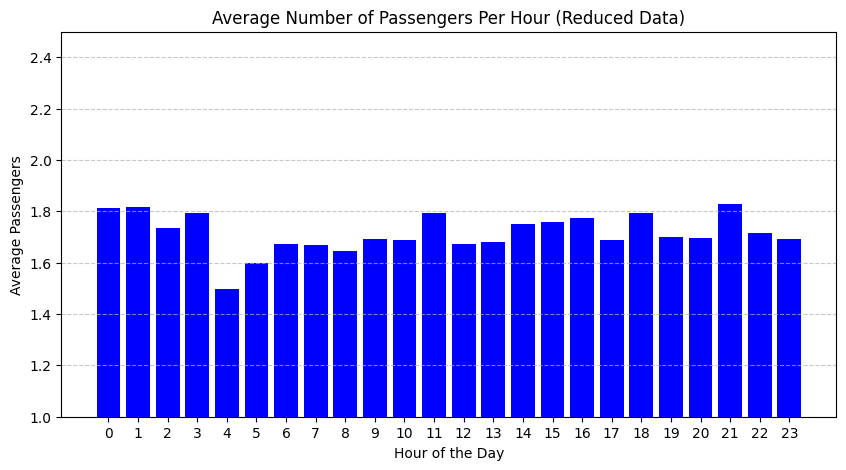

In [32]:
import csv
import datetime
import matplotlib.pyplot as plt
from collections import defaultdict

# File Path for reduced dataset
filename_reduced = "reduced_trip_data.csv"

# Initialize variables
hourly_passenger_count_reduced = defaultdict(list)

# Read the reduced CSV file
with open(filename_reduced, 'r') as f:
    reader = csv.reader(f)
    field_names = [field.strip() for field in next(reader)]  # Remove spaces from column names

    for i, row in enumerate(reader):
        # Parse dates and passenger count
        try:
            pickup_datetime = datetime.datetime.strptime(row[5], "%Y-%m-%d %H:%M:%S")
            passenger_count = int(row[7])
        except (ValueError, IndexError):
            continue
        
        # Collect hourly passenger count for reduced data
        try:
            hour = pickup_datetime.hour
            hourly_passenger_count_reduced[hour].append(passenger_count)
        except (ValueError, IndexError):
            continue

# Compute hourly passenger average for reduced dataset
hourly_avg_passengers_reduced = {hour: sum(counts) / len(counts) for hour, counts in hourly_passenger_count_reduced.items() if counts}

# Plot hourly passenger count for reduced dataset
plt.figure(figsize=(10, 5))
plt.bar(hourly_avg_passengers_reduced.keys(), hourly_avg_passengers_reduced.values(), color='blue')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Passengers')
plt.title('Average Number of Passengers Per Hour (Reduced Data)')
plt.xticks(range(24))
plt.ylim(1, 2.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


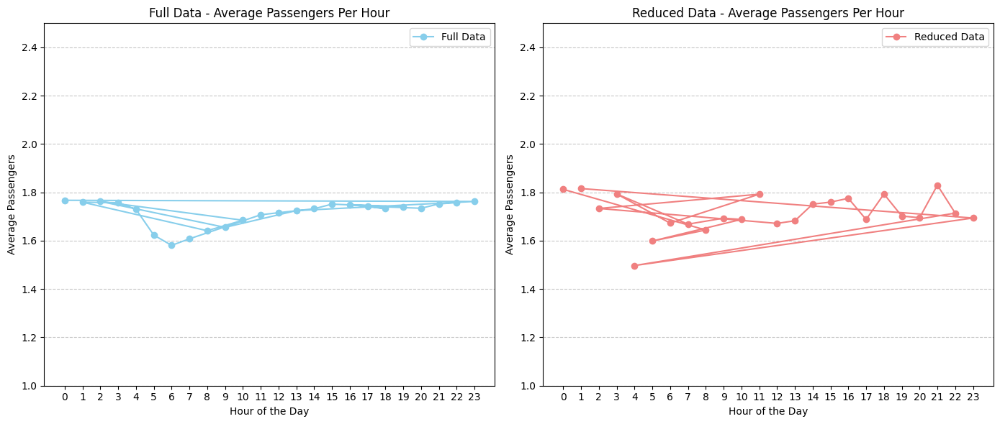

In [33]:
import csv
import datetime
import matplotlib.pyplot as plt
from collections import defaultdict

# File Paths for both datasets
filename_full = "trip_data_6.csv"
filename_reduced = "reduced_trip_data.csv"

# Initialize variables for both datasets
hourly_passenger_count_full = defaultdict(list)
hourly_passenger_count_reduced = defaultdict(list)

# Function to process the CSV files
def process_data(filename, hourly_passenger_count):
    with open(filename, 'r') as f:
        reader = csv.reader(f)
        field_names = [field.strip() for field in next(reader)]  # Remove spaces from column names

        for row in reader:
            try:
                pickup_datetime = datetime.datetime.strptime(row[5], "%Y-%m-%d %H:%M:%S")
                passenger_count = int(row[7])
            except (ValueError, IndexError):
                continue
            
            # Collect hourly passenger count for each dataset
            try:
                hour = pickup_datetime.hour
                hourly_passenger_count[hour].append(passenger_count)
            except (ValueError, IndexError):
                continue

# Process the full and reduced datasets
process_data(filename_full, hourly_passenger_count_full)
process_data(filename_reduced, hourly_passenger_count_reduced)

# Compute hourly passenger averages for both datasets
hourly_avg_passengers_full = {hour: sum(counts) / len(counts) for hour, counts in hourly_passenger_count_full.items() if counts}
hourly_avg_passengers_reduced = {hour: sum(counts) / len(counts) for hour, counts in hourly_passenger_count_reduced.items() if counts}

# Plot comparison of hourly passenger counts using line charts
plt.figure(figsize=(14, 6))

# Plot for full dataset
plt.subplot(1, 2, 1)  # (rows, columns, index)
plt.plot(hourly_avg_passengers_full.keys(), hourly_avg_passengers_full.values(), color='skyblue', marker='o', linestyle='-', label='Full Data')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Passengers')
plt.title('Full Data - Average Passengers Per Hour')
plt.xticks(range(24))
plt.ylim(1, 2.5)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Plot for reduced dataset
plt.subplot(1, 2, 2)
plt.plot(hourly_avg_passengers_reduced.keys(), hourly_avg_passengers_reduced.values(), color='lightcoral', marker='o', linestyle='-', label='Reduced Data')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Passengers')
plt.title('Reduced Data - Average Passengers Per Hour')
plt.xticks(range(24))
plt.ylim(1, 2.5)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Show the plots
plt.tight_layout()
plt.show()
